In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
!python --version

Python 3.10.12


In [3]:
import matplotlib.pyplot as plt
import sklearn as sk
import tensorflow as tf
import keras
import scipy
import sympy
import datetime

import pandas as pd
import numpy as np

In [4]:
!pip install opencv-contrib-python

In [5]:
from google.colab.patches import cv2_imshow
from google.colab import drive
import cv2

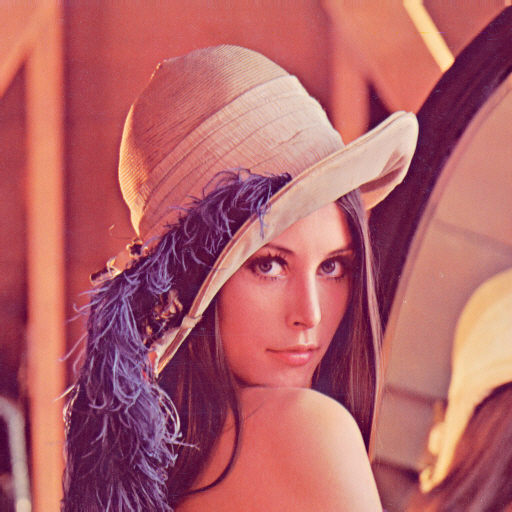

In [6]:
# 영상 불러오기
origin_img = cv2.imread('./gdrive/MyDrive/Genia/2310_OpenCV/Image_Processing/lena.jpg')

# 영상 화면에 표시하기
cv2_imshow(origin_img)

In [7]:
pwd

'/content'

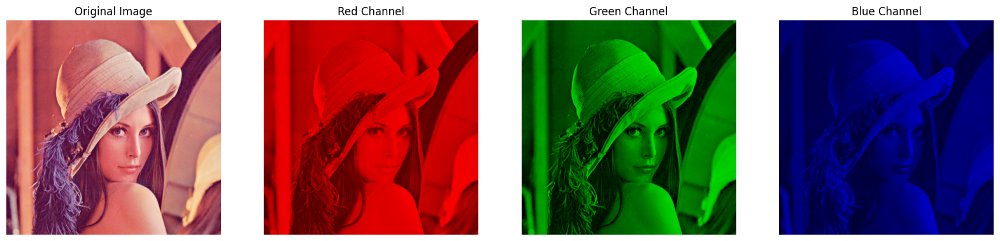

In [8]:
# BGR 채널 순서를 RGB 채널로 변경
RGB_img = cv2.cvtColor(origin_img, cv2.COLOR_BGR2RGB)

# R.G.B 채널로 분할하기, 8bit 분할
Red_img, Green_img, Blue_img = cv2.split(RGB_img)

# 그림을 화면에 출력
plt.figure(figsize=(20, 20))
plt.subplot(1, 4, 1)

# 원 영상 출력
plt.title('Original Image')
plt.imshow(RGB_img)

# R 채널만 출력
RGB_img[:, :, 0] = Red_img
RGB_img[:, :, 1] = 0
RGB_img[:, :, 2] = 0
plt.axis('off')
plt.subplot(1, 4, 2)
plt.title('Red Channel')
plt.imshow(RGB_img)

# G 채널만 출력
RGB_img[:, :, 0] = 0
RGB_img[:, :, 1] = Green_img
RGB_img[:, :, 2] = 0
plt.axis('off')
plt.subplot(1, 4, 3)
plt.title('Green Channel')
plt.imshow(RGB_img)

# B 채널만 출력
RGB_img[:, :, 0] = 0
RGB_img[:, :, 1] = 0
RGB_img[:, :, 2] = Blue_img
plt.axis('off')
plt.subplot(1, 4, 4)
plt.title('Blue Channel')
plt.imshow(RGB_img)

plt.axis('off')
plt.show()

In [9]:
print(Red_img)
print(Green_img)
print(Blue_img)

[[220 220 221 ... 229 222 201]
 [225 225 224 ... 229 222 200]
 [227 227 222 ... 232 222 201]
 ...
 [ 85  83  91 ... 171 173 176]
 [ 82  82  97 ... 179 182 184]
 [ 86  83  96 ... 179 181 187]]
[[139 137 136 ... 147 129  98]
 [137 137 136 ... 148 130  99]
 [137 137 137 ... 148 129  98]
 ...
 [ 18  18  26 ...  74  69  61]
 [ 21  22  30 ...  70  71  75]
 [ 21  21  31 ...  69  71  74]]
[[118 119 133 ... 123 112  93]
 [125 127 134 ... 121 107  87]
 [126 128 132 ... 122 111  89]
 ...
 [ 61  60  58 ...  83  78  78]
 [ 55  56  61 ...  76  80  81]
 [ 61  58  63 ...  78  80  80]]


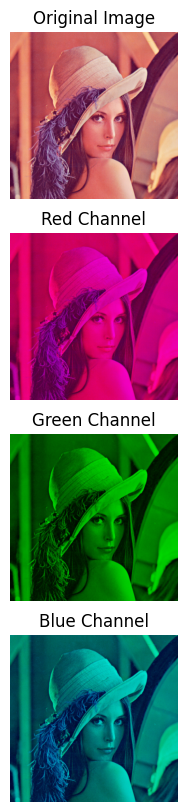

In [10]:
plt.figure(figsize=(10, 10))

# 원 영상 출력
RGB_img = cv2.cvtColor(origin_img, cv2.COLOR_BGR2RGB)
Red_img, Green_img, Blue_img = cv2.split(RGB_img)
plt.subplot(4, 1, 1)
plt.title('Original Image')
plt.imshow(RGB_img)

# R 채널만 출력
RGB_img[:, :, 0] = Red_img
RGB_img[:, :, 1] = 0
RGB_img[:, :, 2] = Blue_img
plt.axis('off')
plt.subplot(4, 1, 2)
plt.title('Red Channel')
plt.imshow(RGB_img)

# G 채널만 출력
RGB_img[:, :, 0] = 0
RGB_img[:, :, 1] = Green_img
RGB_img[:, :, 2] = 0
plt.axis('off')
plt.subplot(4, 1, 3)
plt.title('Green Channel')
plt.imshow(RGB_img)

# B 채널만 출력
RGB_img[:, :, 0] = 0
RGB_img[:, :, 1] = Green_img
RGB_img[:, :, 2] = Blue_img
plt.axis('off')
plt.subplot(4, 1, 4)
plt.title('Blue Channel')
plt.imshow(RGB_img)

plt.axis('off')
plt.show()

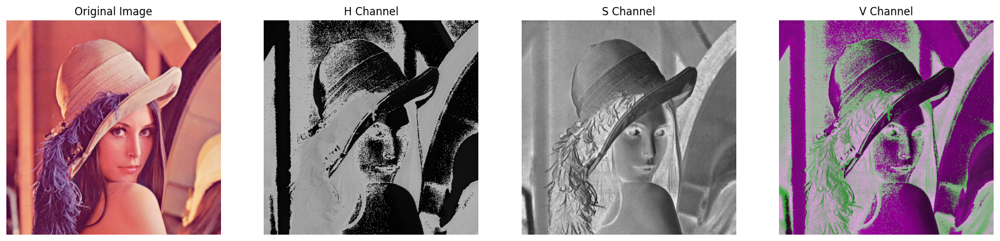

In [11]:
# 원 영상 출력
RGB_img = cv2.cvtColor(origin_img, cv2.COLOR_BGR2RGB)
HSV_img = cv2.cvtColor(RGB_img, cv2.COLOR_RGB2HSV)

H_img, S_img, V_img = cv2.split(HSV_img)


plt.figure(figsize=(20, 10))

plt.subplot(1, 4, 1)
plt.title('Original Image')
plt.imshow(RGB_img)

# S 채널만 출력
RGB_img[:, :, 0] = H_img
RGB_img[:, :, 1] = H_img
RGB_img[:, :, 2] = H_img
plt.axis('off')
plt.subplot(1, 4, 2)
plt.title('H Channel')
plt.imshow(RGB_img)

# H 채널만 출력
RGB_img[:, :, 0] = S_img
RGB_img[:, :, 1] = S_img
RGB_img[:, :, 2] = S_img
plt.axis('off')
plt.subplot(1, 4, 3)
plt.title('S Channel')
plt.imshow(RGB_img)

# V 채널만 출력
RGB_img[:, :, 0] = S_img
RGB_img[:, :, 1] = H_img
RGB_img[:, :, 2] = S_img
plt.axis('off')
plt.subplot(1, 4, 4)
plt.title('V Channel')
plt.imshow(RGB_img)
plt.axis('off')

plt.show()

<b>YIQ</b>
- YUV 색좌표계로부터 유도한 것으로, NTSC 방식에서 사용한다.
- Y는 색의 휘도를, I(In-phase),Q(quadrature phase)는 색도에 관한 정보를 가지고 있다.
- 수식으로 표현하면 다음과 같다.
    - Y = 0.299R' + 0.587G' + 0.114B'  
    - I = -0.596R' - 0.274G' - 0.322B' = Vcos33° - Usin33°
    - Q = 0.211R' - 0.523G' + 0.312B' = Vsin33° - Ucos33°

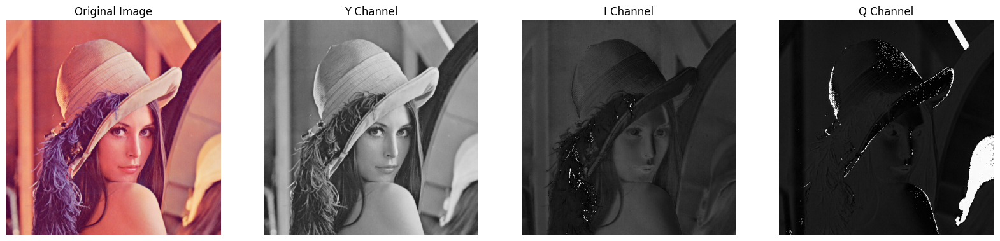

In [12]:
# 원 영상 출력
RGB_img = cv2.cvtColor(origin_img, cv2.COLOR_BGR2RGB)

R_img, G_img, B_img = cv2.split(RGB_img)

Y_img = np.zeros((RGB_img.shape[0], RGB_img.shape[1]), dtype=np.float64)
I_img = np.zeros((RGB_img.shape[0], RGB_img.shape[1]), dtype=np.float64)
Q_img = np.zeros((RGB_img.shape[0], RGB_img.shape[1]), dtype=np.float64)

# 픽셀값 계산, 숫자들은 해당 픽셀을 계산하기 위한 고유값임
for h in range(RGB_img.shape[0]):
    for w in range(RGB_img.shape[1]):
        Y_img[h, w] = 0.299*R_img[h, w] + 0.587*G_img[h, w] + 0.114*B_img[h,w]
        I_img[h, w] = 0.596*R_img[h, w] - 0.275*G_img[h, w] - 0.321*B_img[h,w]
        Q_img[h, w] = 0.212*R_img[h, w] - 0.523*G_img[h, w] + 0.311*B_img[h,w]


plt.figure(figsize=(20, 10))

plt.subplot(1, 4, 1)
plt.title('Original Image')
plt.imshow(RGB_img)

# Y 채널만 출력
RGB_img[:, :, 0] = Y_img
RGB_img[:, :, 1] = Y_img
RGB_img[:, :, 2] = Y_img
plt.axis('off')
plt.subplot(1, 4, 2)
plt.title('Y Channel')
plt.imshow(RGB_img)

# I 채널만 출력
RGB_img[:, :, 0] = I_img
RGB_img[:, :, 1] = I_img
RGB_img[:, :, 2] = I_img
plt.axis('off')
plt.subplot(1, 4, 3)
plt.title('I Channel')
plt.imshow(RGB_img)

# Q 채널만 출력
RGB_img[:, :, 0] = Q_img
RGB_img[:, :, 1] = Q_img
RGB_img[:, :, 2] = Q_img
plt.axis('off')
plt.subplot(1, 4, 4)
plt.title('Q Channel')
plt.imshow(RGB_img)
plt.axis('off')

plt.show()

In [13]:
Y_img = np.zeros((RGB_img.shape[0], RGB_img.shape[1]), dtype=np.float64)
Y_img #[511]

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

RGB2YCbCr

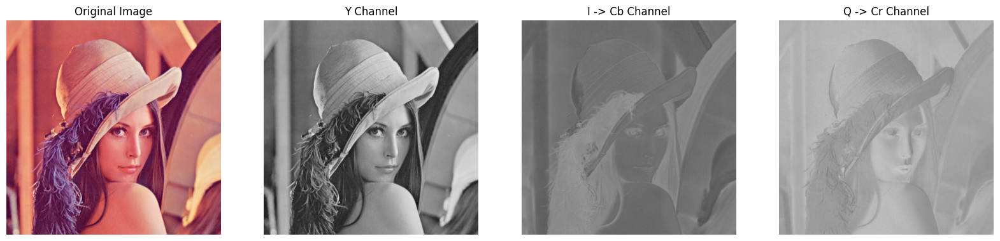

In [14]:
# 원 영상 출력
RGB_img = cv2.cvtColor(origin_img, cv2.COLOR_BGR2RGB)

R_img, G_img, B_img = cv2.split(RGB_img)

Y_img = np.zeros((RGB_img.shape[0], RGB_img.shape[1]), dtype=np.float64)
I_img = np.zeros((RGB_img.shape[0], RGB_img.shape[1]), dtype=np.float64)
Q_img = np.zeros((RGB_img.shape[0], RGB_img.shape[1]), dtype=np.float64)

delta = 128

# 픽셀값 계산, 숫자들은 해당 픽셀을 계산하기 위한 고유값임
for h in range(RGB_img.shape[0]):
    for w in range(RGB_img.shape[1]):
        Y_img[h, w] = 0.299*R_img[h, w] + 0.587*G_img[h, w] + 0.114*B_img[h,w]
        I_img[h, w] = (B_img[h, w] - Y_img[h, w]) * 0.564 + delta
        Q_img[h, w] = (R_img[h, w] - Y_img[h, w]) * 0.713 + delta

        # cr = (R_img - Y_img) * 0.713 + delta
        # cb = (B_img - Y_img) * 0.564 + delta
        # R_img = Y_img + 1.403 * cr - delta
        # G_img = Y_img - 0.714 * (cr - delta) - 0.344 * (cb - delta)
        # B_img = Y_img + 1.773 * (cb - delta)


plt.figure(figsize=(20, 10))

plt.subplot(1, 4, 1)
plt.title('Original Image')
plt.imshow(RGB_img)

# R 채널만 출력
RGB_img[:, :, 0] = Y_img
RGB_img[:, :, 1] = Y_img
RGB_img[:, :, 2] = Y_img
plt.axis('off')
plt.subplot(1, 4, 2)
plt.title('Y Channel')
plt.imshow(RGB_img)

# G 채널만 출력
RGB_img[:, :, 0] = I_img
RGB_img[:, :, 1] = I_img
RGB_img[:, :, 2] = I_img
plt.axis('off')
plt.subplot(1, 4, 3)
plt.title('I -> Cb Channel')
plt.imshow(RGB_img)

# B 채널만 출력
RGB_img[:, :, 0] = Q_img
RGB_img[:, :, 1] = Q_img
RGB_img[:, :, 2] = Q_img
plt.axis('off')
plt.subplot(1, 4, 4)
plt.title('Q -> Cr Channel')
plt.imshow(RGB_img)

plt.axis('off')
plt.show()

Pixel Add

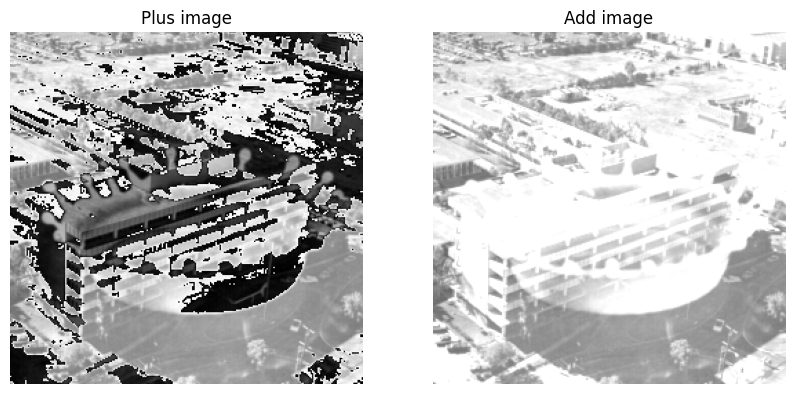

In [15]:
img1 = cv2.imread('./gdrive/MyDrive/Genia/2310_OpenCV/Image_Processing/aero2.bmp')
img2 = cv2.imread('./gdrive/MyDrive/Genia/2310_OpenCV/Image_Processing/milkdrop.bmp')
img_plus = img1 + img2            # 255 넘어설 수 있음
img_add = cv2.add(img1, img2)     # 255 범위 한정

plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.title('Plus image')
plt.imshow(img_plus)
plt.axis('off')
plt.subplot(1, 2, 2)
plt.title('Add image')
plt.imshow(img_add)

plt.axis('off')
plt.show()

Pixel Subtraction

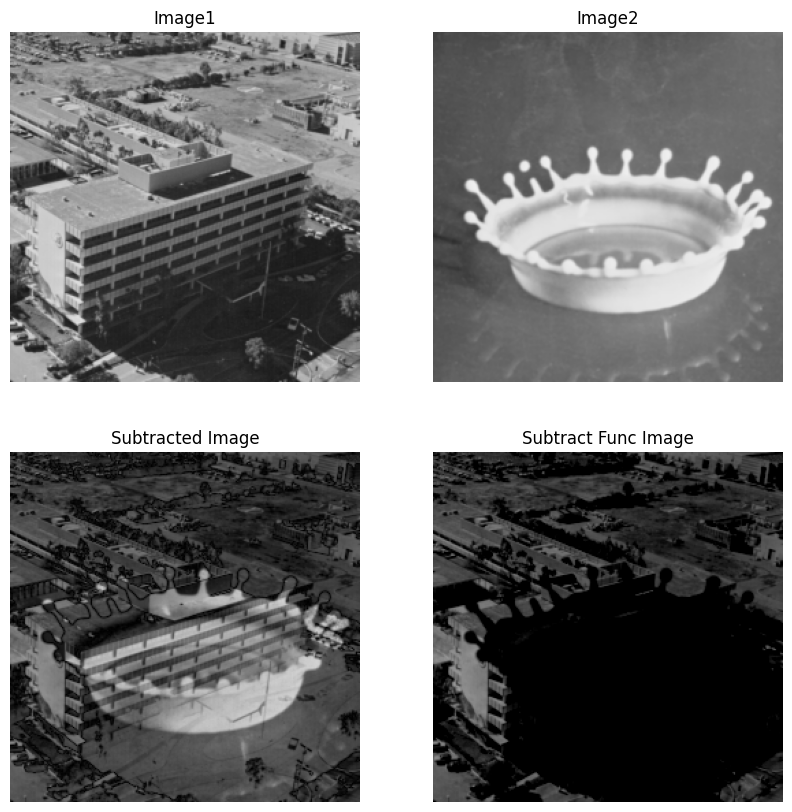

In [16]:
img1 = cv2.imread('./gdrive/MyDrive/Genia/2310_OpenCV/Image_Processing/aero2.bmp')
img2 = cv2.imread('./gdrive/MyDrive/Genia/2310_OpenCV/Image_Processing/milkdrop.bmp')

# 원 영상 출력
RGB_img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
RGB_img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
output_img = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

R_img1, G_img1, B_img1 = cv2.split(RGB_img1)
R_img2, G_img2, B_img2 = cv2.split(RGB_img2)

# unsigned byte (0~255)로 설정
# unsigned : 부호 없이 (+ 방향으로 설정한다)
R_plus = np.zeros((RGB_img1.shape[0], RGB_img1.shape[1]), dtype=np.ubyte)
G_plus = np.zeros((RGB_img1.shape[0], RGB_img1.shape[1]), dtype=np.ubyte)
B_plus = np.zeros((RGB_img1.shape[0], RGB_img1.shape[1]), dtype=np.ubyte)

for h in range(RGB_img1.shape[0]):
    for w in range(RGB_img1.shape[1]):
        R_plus[h, w] = np.abs(np.int32(R_img1[h, w]) - np.int32(R_img2[h, w]))
        G_plus[h, w] = np.abs(np.int32(G_img1[h, w]) - np.int32(G_img2[h, w]))
        B_plus[h, w] = np.abs(np.int32(B_img1[h, w]) - np.int32(B_img2[h, w]))

img_subtract_func = cv2.subtract(img1, img2)


plt.figure(figsize=(10, 10))

plt.subplot(2, 2, 1)
plt.title('Image1')
plt.imshow(RGB_img1)
plt.axis('off')

plt.subplot(2, 2, 2)
plt.title('Image2')
plt.imshow(RGB_img2)
plt.axis('off')

plt.subplot(2, 2, 3)
output_img[:, :, 0] = R_plus
output_img[:, :, 1] = G_plus
output_img[:, :, 2] = B_plus
plt.title('Subtracted Image')
plt.imshow(output_img)
plt.axis('off')

plt.subplot(2, 2, 4)
plt.title('Subtract Func Image')
plt.imshow(img_subtract_func)
plt.axis('off')

plt.show()

Pixel Blending

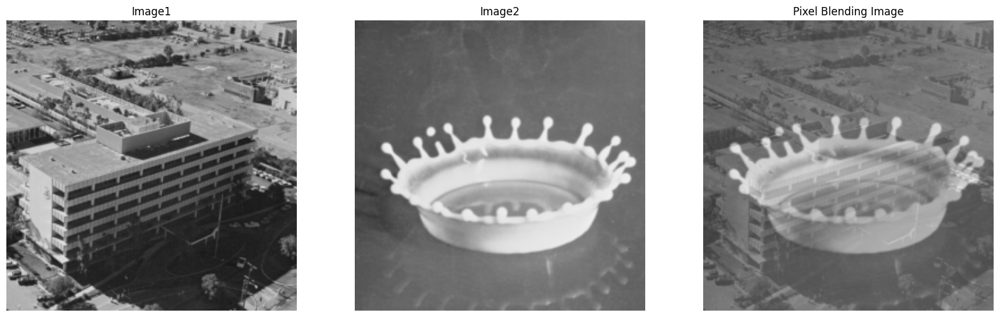

In [17]:
# 원 영상 출력
RGB_img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
RGB_img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
output_img = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

R_img1, G_img1, B_img1 = cv2.split(RGB_img1)
R_img2, G_img2, B_img2 = cv2.split(RGB_img2)

R_plus = np.zeros((RGB_img1.shape[0], RGB_img1.shape[1]), dtype=np.ubyte)
G_plus = np.zeros((RGB_img1.shape[0], RGB_img1.shape[1]), dtype=np.ubyte)
B_plus = np.zeros((RGB_img1.shape[0], RGB_img1.shape[1]), dtype=np.ubyte)

def saturation(value):
    if(value > 255):
        value = 255
    return value

# 가중치
W = 0.3

for h in range(RGB_img1.shape[0]):
    for w in range(RGB_img1.shape[1]):
        R_plus[h, w] = saturation(np.fabs(W * np.float32(R_img1[h, w]) + (1-W) * np.float32(R_img2[h, w])))
        G_plus[h, w] = saturation(np.fabs(W * np.float32(G_img1[h, w]) + (1-W) * np.float32(G_img2[h, w])))
        B_plus[h, w] = saturation(np.fabs(W * np.float32(B_img1[h, w]) + (1-W) * np.float32(B_img2[h, w])))


plt.figure(figsize=(20, 10))

plt.subplot(1, 3, 1)
plt.title('Image1')
plt.imshow(RGB_img1)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Image2')
plt.imshow(RGB_img2)
plt.axis('off')

plt.subplot(1, 3, 3)
output_img[:, :, 0] = R_plus
output_img[:, :, 1] = G_plus
output_img[:, :, 2] = B_plus
plt.title('Pixel Blending Image')
plt.imshow(output_img)
plt.axis('off')

plt.show()

Pixel Multiplication

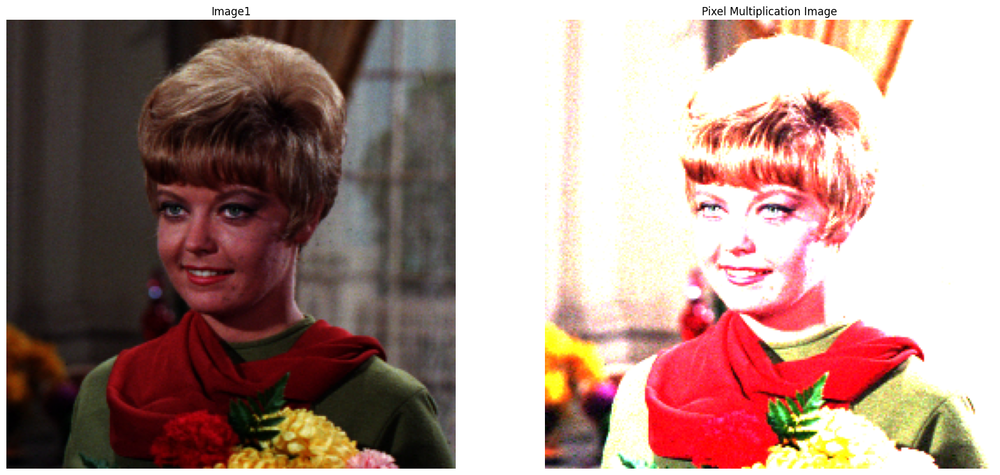

In [18]:
img1 = cv2.imread('./gdrive/MyDrive/Genia/2310_OpenCV/Image_Processing/girl.jpg')

# 원 영상 출력
RGB_img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
output_img = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

R_img1, G_img1, B_img1 = cv2.split(RGB_img1)

R_plus = np.zeros((RGB_img1.shape[0], RGB_img1.shape[1]), dtype=np.ubyte)
G_plus = np.zeros((RGB_img1.shape[0], RGB_img1.shape[1]), dtype=np.ubyte)
B_plus = np.zeros((RGB_img1.shape[0], RGB_img1.shape[1]), dtype=np.ubyte)

def saturation(value):
    if(value > 255):
        value = 255
    return value

# 상수값
C = 7

for h in range(RGB_img1.shape[0]):
    for w in range(RGB_img1.shape[1]):
        R_plus[h, w] = saturation(np.int32(R_img1[h, w]) * C)
        G_plus[h, w] = saturation(np.int32(G_img1[h, w]) * C)
        B_plus[h, w] = saturation(np.int32(B_img1[h, w]) * C)


plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.title('Image1')
plt.imshow(RGB_img1)
plt.axis('off')

plt.subplot(1, 2, 2)
output_img[:, :, 0] = R_plus
output_img[:, :, 1] = G_plus
output_img[:, :, 2] = B_plus
plt.title('Pixel Multiplication Image')
plt.imshow(output_img)
plt.axis('off')

plt.show()

Pixel Binarization (이진화)
- 구분하기 위한 과정

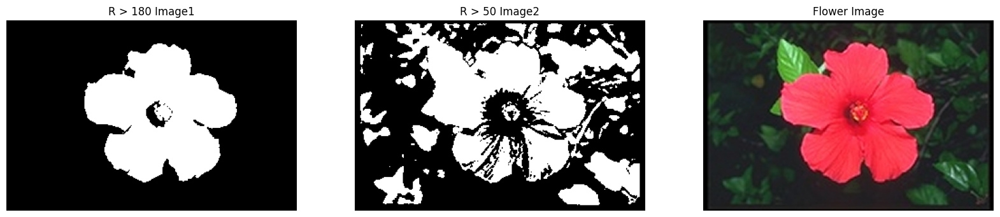

In [19]:
img1 = cv2.imread('./gdrive/MyDrive/Genia/2310_OpenCV/Image_Processing/flower.bmp')
img2 = cv2.imread('./gdrive/MyDrive/Genia/2310_OpenCV/Image_Processing/flower.bmp')
img3 = cv2.imread('./gdrive/MyDrive/Genia/2310_OpenCV/Image_Processing/flower.bmp')

# 원 영상 출력
RGB_img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
RGB_img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
output_img = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)

R_img1, G_img1, B_img1 = cv2.split(RGB_img1)
R_img2, G_img2, B_img2 = cv2.split(RGB_img2)

R_plus = np.zeros((RGB_img1.shape[0], RGB_img1.shape[1]), dtype=np.ubyte)
G_plus = np.zeros((RGB_img1.shape[0], RGB_img1.shape[1]), dtype=np.ubyte)
B_plus = np.zeros((RGB_img1.shape[0], RGB_img1.shape[1]), dtype=np.ubyte)

def saturation(value):
    if(value > 255):
        value = 255
    return value

# Binarization
for h in range(RGB_img1.shape[0]):
    for w in range(RGB_img1.shape[1]):
        if(np.int32(R_img1[h, w]) > 200):
            R_img1[h, w] = G_img1[h, w] = B_img1[h, w] = 255
        else:
            R_img1[h, w] = G_img1[h, w] = B_img1[h, w] = 0
        if(np.int32(G_img2[h, w]) > 50):
            R_img2[h, w] = G_img2[h, w] = B_img2[h, w] = 255
        else:
            R_img2[h, w] = G_img2[h, w] = B_img2[h, w] = 0

# 이미지 다시 넣기
RGB_img1[:, :, 0] = R_img1
RGB_img1[:, :, 1] = G_img1
RGB_img1[:, :, 2] = B_img1
RGB_img2[:, :, 0] = R_img2
RGB_img2[:, :, 1] = G_img2
RGB_img2[:, :, 2] = B_img2


plt.figure(figsize=(20, 10))

plt.subplot(1, 3, 1)
plt.title('R > 180 Image1')
plt.imshow(RGB_img1)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('R > 50 Image2')
plt.imshow(RGB_img2)
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Flower Image')
plt.imshow(output_img)
plt.axis('off')

plt.show()

Pixel Bit AND

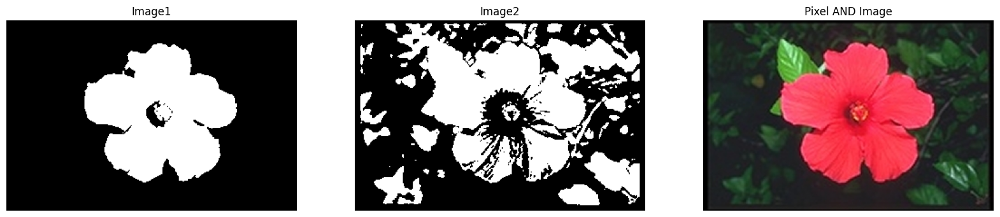

In [20]:
img1 = cv2.imread('./gdrive/MyDrive/Genia/2310_OpenCV/Image_Processing/flower.bmp')
img2 = cv2.imread('./gdrive/MyDrive/Genia/2310_OpenCV/Image_Processing/flower.bmp')
img3 = cv2.imread('./gdrive/MyDrive/Genia/2310_OpenCV/Image_Processing/flower.bmp')

# 원 영상 출력
RGB_img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
RGB_img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
output_img = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)

R_img1, G_img1, B_img1 = cv2.split(RGB_img1)
R_img2, G_img2, B_img2 = cv2.split(RGB_img2)

R_plus = np.zeros((RGB_img1.shape[0], RGB_img1.shape[1]), dtype=np.ubyte)
G_plus = np.zeros((RGB_img1.shape[0], RGB_img1.shape[1]), dtype=np.ubyte)
B_plus = np.zeros((RGB_img1.shape[0], RGB_img1.shape[1]), dtype=np.ubyte)

def saturation(value):
    if(value > 255):
        value = 255
    return value

# Binarization
for h in range(RGB_img1.shape[0]):
    for w in range(RGB_img1.shape[1]):
        if(np.int32(R_img1[h, w]) > 200):
            R_img1[h, w] = G_img1[h, w] = B_img1[h, w] = 255
        else:
            R_img1[h, w] = G_img1[h, w] = B_img1[h, w] = 0
        if(np.int32(G_img2[h, w]) > 50):
            R_img2[h, w] = G_img2[h, w] = B_img2[h, w] = 255
        else:
            R_img2[h, w] = G_img2[h, w] = B_img2[h, w] = 0

# for문 돌며 픽셀 비트 AND 연산
for h in range(RGB_img1.shape[0]):
    for w in range(RGB_img1.shape[1]):
        R_plus[h, w] = saturation(np.int32(R_img1[h, w]) & np.int32(R_img2[h, w]))
        G_plus[h, w] = saturation(np.int32(G_img1[h, w]) & np.int32(G_img2[h, w]))
        B_plus[h, w] = saturation(np.int32(B_img1[h, w]) & np.int32(B_img2[h, w]))

# 이미지 다시 넣기
RGB_img1[:, :, 0] = R_img1
RGB_img1[:, :, 1] = G_img1
RGB_img1[:, :, 2] = B_img1
RGB_img2[:, :, 0] = R_img2
RGB_img2[:, :, 1] = G_img2
RGB_img2[:, :, 2] = B_img2


plt.figure(figsize=(20, 10))

plt.subplot(1, 3, 1)
plt.title('Image1')
plt.imshow(RGB_img1)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Image2')
plt.imshow(RGB_img2)
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Pixel AND Image')
plt.imshow(output_img)
plt.axis('off')

plt.show()

Pixel Mask

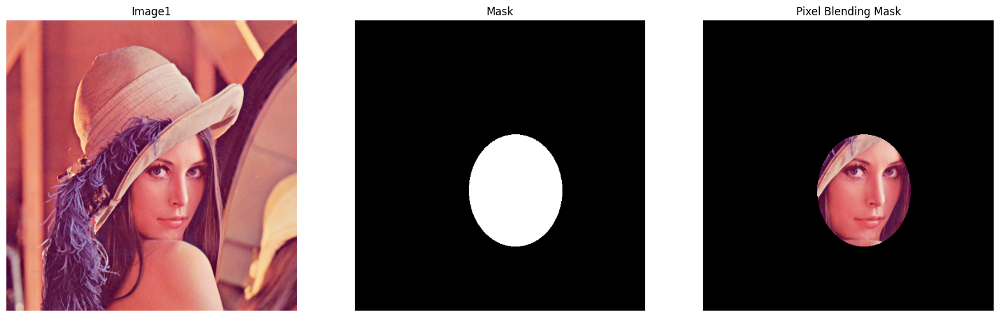

In [21]:
img1 = cv2.imread('./gdrive/MyDrive/Genia/2310_OpenCV/Image_Processing/lena.jpg')
img2 = cv2.imread('./gdrive/MyDrive/Genia/2310_OpenCV/Image_Processing/lena-mask.bmp')

# 원 영상 출력
RGB_img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
RGB_img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
output_img = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

R_img1, G_img1, B_img1 = cv2.split(RGB_img1)
R_img2, G_img2, B_img2 = cv2.split(RGB_img2)

R_plus = np.zeros((RGB_img1.shape[0], RGB_img1.shape[1]), dtype=np.ubyte)
G_plus = np.zeros((RGB_img1.shape[0], RGB_img1.shape[1]), dtype=np.ubyte)
B_plus = np.zeros((RGB_img1.shape[0], RGB_img1.shape[1]), dtype=np.ubyte)

def saturation(value):
    if(value > 255):
        value = 255
    return value

# Binarization
for h in range(RGB_img2.shape[0]):
    for w in range(RGB_img2.shape[1]):
        if(np.int32(R_img2[h, w]) <= 0):
            R_img2[h, w] = G_img2[h, w] = B_img2[h, w] = 255
        else:
            R_img2[h, w] = G_img2[h, w] = B_img2[h, w] = 0

# for문 돌며 픽셀 비트 AND 연산
for h in range(RGB_img1.shape[0]):
    for w in range(RGB_img1.shape[1]):
        R_plus[h, w] = saturation(np.int32(R_img1[h, w]) & np.int32(R_img2[h, w]))
        G_plus[h, w] = saturation(np.int32(G_img1[h, w]) & np.int32(G_img2[h, w]))
        B_plus[h, w] = saturation(np.int32(B_img1[h, w]) & np.int32(B_img2[h, w]))

# 이미지 다시 넣기
RGB_img1[:, :, 0] = R_img1
RGB_img1[:, :, 1] = G_img1
RGB_img1[:, :, 2] = B_img1
RGB_img2[:, :, 0] = R_img2
RGB_img2[:, :, 1] = G_img2
RGB_img2[:, :, 2] = B_img2


plt.figure(figsize=(20, 10))

plt.subplot(1, 3, 1)
plt.title('Image1')
plt.imshow(RGB_img1)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Mask')
plt.imshow(RGB_img2)
plt.axis('off')

plt.subplot(1, 3, 3)
output_img[:, :, 0] = R_plus
output_img[:, :, 1] = G_plus
output_img[:, :, 2] = B_plus
plt.title('Pixel Blending Mask')
plt.imshow(output_img)
plt.axis('off')

plt.show()

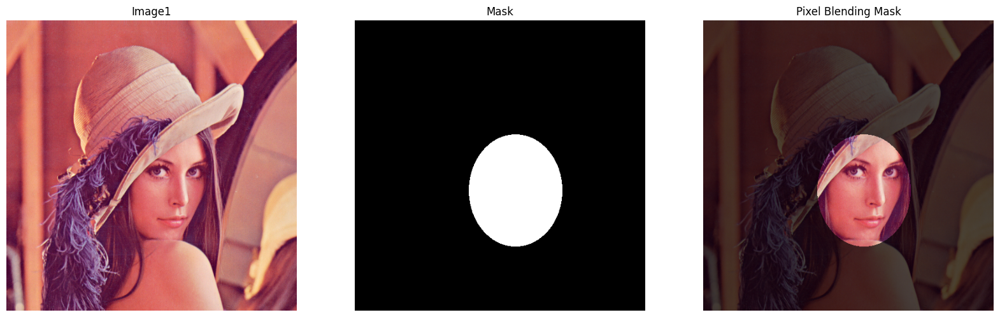

In [22]:
img1 = cv2.imread('./gdrive/MyDrive/Genia/2310_OpenCV/Image_Processing/lena.jpg')
img2 = cv2.imread('./gdrive/MyDrive/Genia/2310_OpenCV/Image_Processing/lena-mask.bmp')

# 원 영상 출력
RGB_img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
RGB_img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
output_img = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

R_img1, G_img1, B_img1 = cv2.split(RGB_img1)
R_img2, G_img2, B_img2 = cv2.split(RGB_img2)

R_plus = np.zeros((RGB_img1.shape[0], RGB_img1.shape[1]), dtype=np.ubyte)
G_plus = np.zeros((RGB_img1.shape[0], RGB_img1.shape[1]), dtype=np.ubyte)
B_plus = np.zeros((RGB_img1.shape[0], RGB_img1.shape[1]), dtype=np.ubyte)

def saturation(value):
    if(value > 255):
        value = 255
    return value

# Binarization
for h in range(RGB_img2.shape[0]):
    for w in range(RGB_img2.shape[1]):
        if(np.int32(R_img2[h, w]) <= 0):
            R_img2[h, w] = G_img2[h, w] = B_img2[h, w] = 255
        else:
            R_img2[h, w] = G_img2[h, w] = B_img2[h, w] = 0

for h in range(RGB_img1.shape[0]):
    for w in range(RGB_img1.shape[1]):
        R_plus[h, w] = saturation(np.int32(R_img1[h, w]) & np.int32(R_img2[h, w]))
        G_plus[h, w] = saturation(np.int32(G_img1[h, w]) & np.int32(G_img2[h, w]))
        B_plus[h, w] = saturation(np.int32(B_img1[h, w]) & np.int32(B_img2[h, w]))

W = 0.3

for h in range(RGB_img1.shape[0]):
    for w in range(RGB_img1.shape[1]):
        R_plus[h, w] = saturation(W * np.float32(R_img1[h, w]) + (1-W) * np.float32(R_plus[h, w]))
        G_plus[h, w] = saturation(W * np.float32(G_img1[h, w]) + (1-W) * np.float32(G_plus[h, w]))
        B_plus[h, w] = saturation(W * np.float32(B_img1[h, w]) + (1-W) * np.float32(B_plus[h, w]))

# 이미지 다시 넣기
RGB_img1[:, :, 0] = R_img1
RGB_img1[:, :, 1] = G_img1
RGB_img1[:, :, 2] = B_img1
RGB_img2[:, :, 0] = R_img2
RGB_img2[:, :, 1] = G_img2
RGB_img2[:, :, 2] = B_img2


plt.figure(figsize=(20, 10))

plt.subplot(1, 3, 1)
plt.title('Image1')
plt.imshow(RGB_img1)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Mask')
plt.imshow(RGB_img2)
plt.axis('off')

plt.subplot(1, 3, 3)
output_img[:, :, 0] = R_plus
output_img[:, :, 1] = G_plus
output_img[:, :, 2] = B_plus
plt.title('Pixel Blending Mask')
plt.imshow(output_img)
plt.axis('off')

plt.show()

Pixel Bit AND / OR

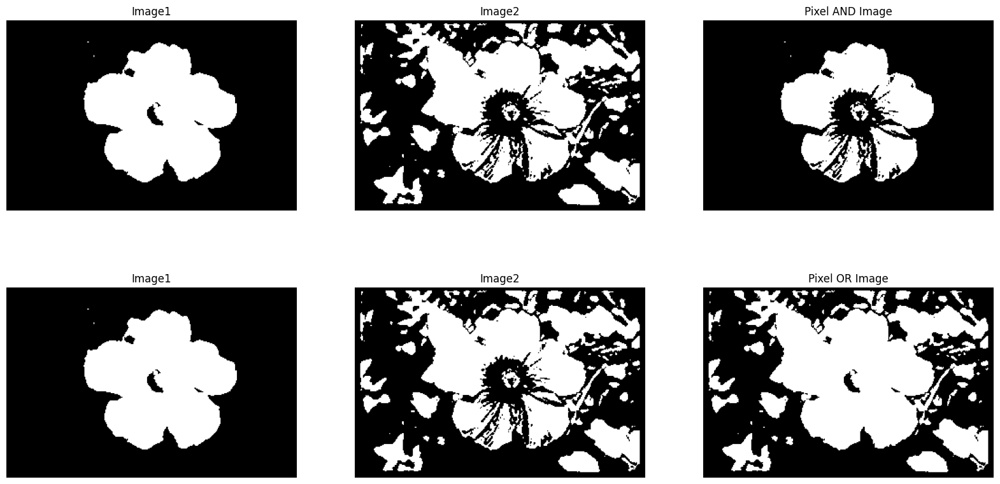

In [23]:
img1 = cv2.imread('./gdrive/MyDrive/Genia/2310_OpenCV/Image_Processing/flower.bmp')
img2 = cv2.imread('./gdrive/MyDrive/Genia/2310_OpenCV/Image_Processing/flower.bmp')
img3 = cv2.imread('./gdrive/MyDrive/Genia/2310_OpenCV/Image_Processing/flower.bmp')

plt.figure(figsize=(20, 10))

# 원 영상 출력
RGB_img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
RGB_img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
output_img = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)

R_img1, G_img1, B_img1 = cv2.split(RGB_img1)
R_img2, G_img2, B_img2 = cv2.split(RGB_img2)

R_plus = np.zeros((RGB_img1.shape[0], RGB_img1.shape[1]), dtype=np.ubyte)
G_plus = np.zeros((RGB_img1.shape[0], RGB_img1.shape[1]), dtype=np.ubyte)
B_plus = np.zeros((RGB_img1.shape[0], RGB_img1.shape[1]), dtype=np.ubyte)

def saturation(value):
    if(value > 255):
        value = 255
    return value

# Binarization
for h in range(RGB_img1.shape[0]):
    for w in range(RGB_img1.shape[1]):
        if(np.int32(R_img1[h, w]) > 180):
            R_img1[h, w] = G_img1[h, w] = B_img1[h, w] = 255
        else:
            R_img1[h, w] = G_img1[h, w] = B_img1[h, w] = 0
        if(np.int32(G_img2[h, w]) > 50):
            R_img2[h, w] = G_img2[h, w] = B_img2[h, w] = 255
        else:
            R_img2[h, w] = G_img2[h, w] = B_img2[h, w] = 0

# for문 돌며 픽셀 비트 AND 연산
for h in range(RGB_img1.shape[0]):
    for w in range(RGB_img1.shape[1]):
        R_plus[h, w] = saturation(np.int32(R_img1[h, w]) & np.int32(R_img2[h, w]))
        G_plus[h, w] = saturation(np.int32(G_img1[h, w]) & np.int32(G_img2[h, w]))
        B_plus[h, w] = saturation(np.int32(B_img1[h, w]) & np.int32(B_img2[h, w]))

# 이미지 다시 넣기
RGB_img1[:, :, 0] = R_img1
RGB_img1[:, :, 1] = G_img1
RGB_img1[:, :, 2] = B_img1
RGB_img2[:, :, 0] = R_img2
RGB_img2[:, :, 1] = G_img2
RGB_img2[:, :, 2] = B_img2

plt.subplot(2, 3, 1)
plt.title('Image1')
plt.imshow(RGB_img1)
plt.axis('off')

plt.subplot(2, 3, 2)
plt.title('Image2')
plt.imshow(RGB_img2)
plt.axis('off')

plt.subplot(2, 3, 3)
output_img[:, :, 0] = R_plus
output_img[:, :, 1] = G_plus
output_img[:, :, 2] = B_plus
plt.title('Pixel AND Image')
plt.imshow(output_img)
plt.axis('off')

# for문 돌며 픽셀 비트 OR 연산
for h in range(RGB_img1.shape[0]):
    for w in range(RGB_img1.shape[1]):
        R_plus[h, w] = saturation(np.int32(R_img1[h, w]) | np.int32(R_img2[h, w]))
        G_plus[h, w] = saturation(np.int32(G_img1[h, w]) | np.int32(G_img2[h, w]))
        B_plus[h, w] = saturation(np.int32(B_img1[h, w]) | np.int32(B_img2[h, w]))

# 이미지 다시 넣기
RGB_img1[:, :, 0] = R_img1
RGB_img1[:, :, 1] = G_img1
RGB_img1[:, :, 2] = B_img1
RGB_img2[:, :, 0] = R_img2
RGB_img2[:, :, 1] = G_img2
RGB_img2[:, :, 2] = B_img2

plt.subplot(2, 3, 4)
plt.title('Image1')
plt.imshow(RGB_img1)
plt.axis('off')

plt.subplot(2, 3, 5)
plt.title('Image2')
plt.imshow(RGB_img2)
plt.axis('off')

plt.subplot(2, 3, 6)
output_img[:, :, 0] = R_plus
output_img[:, :, 1] = G_plus
output_img[:, :, 2] = B_plus
plt.title('Pixel OR Image')
plt.imshow(output_img)
plt.axis('off')

plt.show()

Histogram

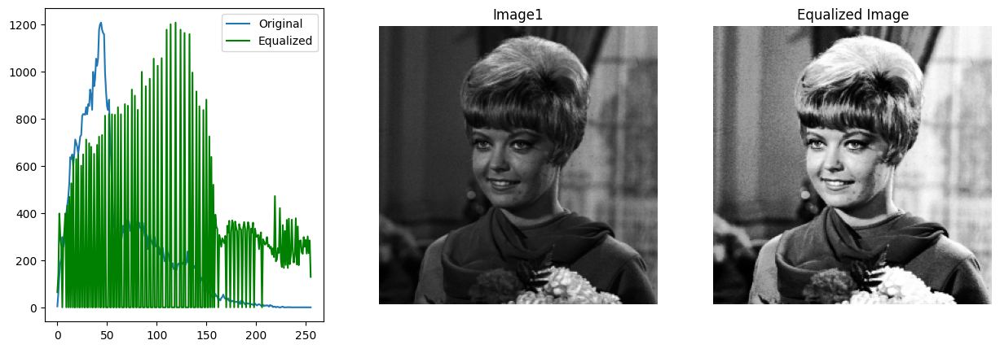

In [78]:
# color to gray
img = cv2.imread('./gdrive/MyDrive/Genia/2310_OpenCV/Image_Processing/girl.jpg')
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
output_img = cv2.equalizeHist(gray_img)

hist = cv2.calcHist([gray_img], [0], None, [256], [0,256])
hist2 = cv2.calcHist([output_img], [0], None, [256], [0,256])

plt.figure(figsize=(15,5))

plt.subplot(1, 3, 1)
plt.plot(hist, label='Original')
plt.plot(hist2, label = 'Equalized', color='g')
plt.legend()

plt.subplot(1, 3, 2)
plt.title('Image1')
plt.imshow(gray_img, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Equalized Image')
plt.imshow(output_img, cmap='gray')
plt.axis('off')

plt.show()

Scaling * 2

original image (210, 320)


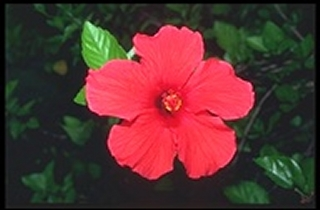

Nearest Neighbor Interpolation x2 (420, 640)


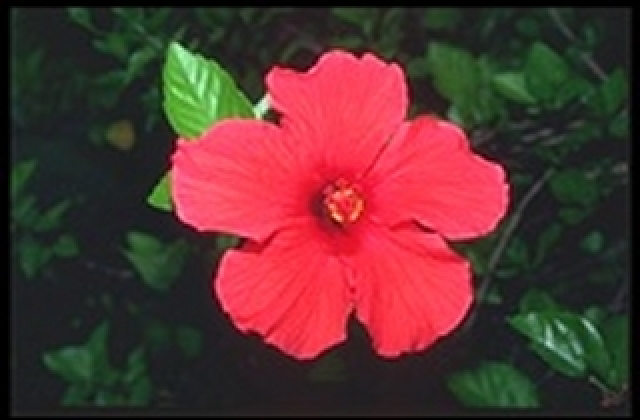

Nearest Neighbor Interpolation x3 (630, 960)


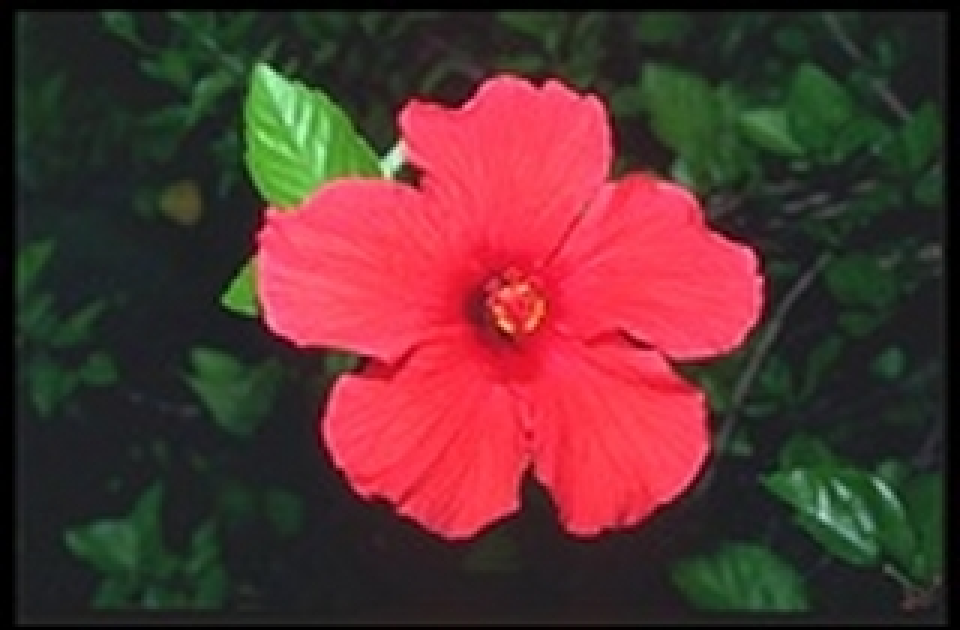

Nearest Neighbor Interpolation x4 (840, 1280)


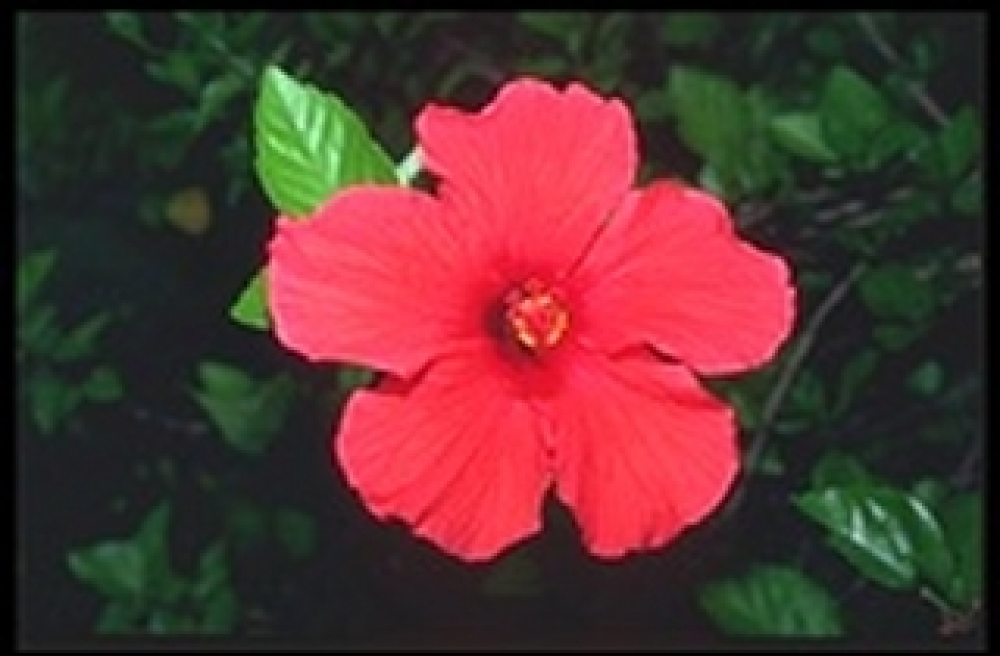

In [76]:
img = cv2.imread('./gdrive/MyDrive/Genia/2310_OpenCV/Image_Processing/flower.bmp')

height, width = img.shape[:2]
output_img = cv2.resize(img, (2*width, 2*height), interpolation = cv2.INTER_NEAREST)
output_img3 = cv2.resize(img, (3*width, 3*height), interpolation = cv2.INTER_NEAREST)
output_img4 = cv2.resize(img, (4*width, 4*height), interpolation = cv2.INTER_NEAREST)

print('original image', img.shape[:2])
cv2_imshow(img)
print('Nearest Neighbor Interpolation x2', output_img.shape[:2])
cv2_imshow(output_img)
print('Nearest Neighbor Interpolation x3', output_img3.shape[:2])
cv2_imshow(output_img3)
print('Nearest Neighbor Interpolation x4', output_img4.shape[:2])
cv2_imshow(output_img4)

Scaling * 1/2

original image (210, 320)


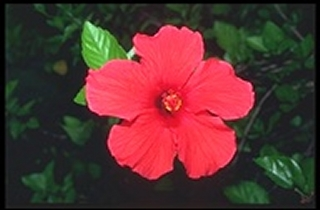

Nearest Neighbor Interpolation 1/2 (105, 160)


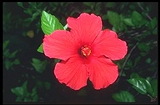

Nearest Neighbor Interpolation 1/3 (70, 106)


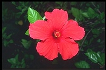

Nearest Neighbor Interpolation 1/4 (52, 80)


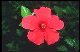

Nearest Neighbor Interpolation 1/5 (42, 64)


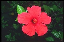

In [77]:
img = cv2.imread('./gdrive/MyDrive/Genia/2310_OpenCV/Image_Processing/flower.bmp')

height, width = img.shape[:2]
output_img = cv2.resize(img, (int(width/2), int(height/2)), interpolation = cv2.INTER_NEAREST)
output_img2 = cv2.resize(img, (int(width/3), int(height/3)), interpolation = cv2.INTER_NEAREST)
output_img3 = cv2.resize(img, (int(width/4), int(height/4)), interpolation = cv2.INTER_NEAREST)
output_img4 = cv2.resize(img, (int(width/5), int(height/5)), interpolation = cv2.INTER_NEAREST)

print('original image', img.shape[:2])
cv2_imshow(img)
print('Nearest Neighbor Interpolation 1/2', output_img.shape[:2])
cv2_imshow(output_img)
print('Nearest Neighbor Interpolation 1/3', output_img2.shape[:2])
cv2_imshow(output_img2)
print('Nearest Neighbor Interpolation 1/4', output_img3.shape[:2])
cv2_imshow(output_img3)
print('Nearest Neighbor Interpolation 1/5', output_img4.shape[:2])
cv2_imshow(output_img4)

Rotation

original image (210, 320)


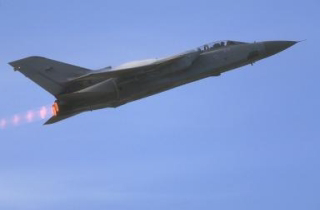

Rotation Transformation 90 (210, 320)


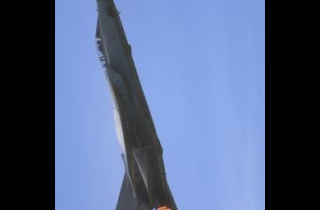

Rotation Transformation 180 (210, 320)


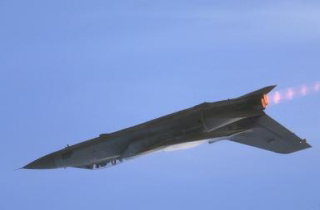

Rotation Transformation 300 (210, 320)


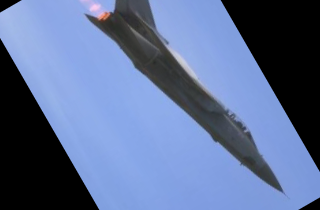

In [71]:
img = cv2.imread('./gdrive/MyDrive/Genia/2310_OpenCV/Image_Processing/airplane.bmp')

rows, cols = img.shape[:2]

M = cv2.getRotationMatrix2D(((cols-1)/2.0, (rows-1)/2.0), 90, 1)
output_img = cv2.warpAffine(img, M, (int(cols*1), rows*1), flags = cv2.INTER_LINEAR)
M2 = cv2.getRotationMatrix2D(((cols-1)/2.0, (rows-1)/2.0), 180, 1)
output_img2 = cv2.warpAffine(img, M2, (cols*1, rows*1), flags = cv2.INTER_LINEAR)
M3 = cv2.getRotationMatrix2D(((cols-1)/2.0, (rows-1)/2.0), 300, 1)
output_img3 = cv2.warpAffine(img, M3, (cols*1, rows*1), flags = cv2.INTER_LINEAR)

print('original image', img.shape[:2])
cv2_imshow(img)
print('Rotation Transformation 90', output_img.shape[:2])
cv2_imshow(output_img)
print('Rotation Transformation 180', output_img.shape[:2])
cv2_imshow(output_img2)
print('Rotation Transformation 300', output_img.shape[:2])
cv2_imshow(output_img3)

Scaling, Rotation, Translation

Original Image


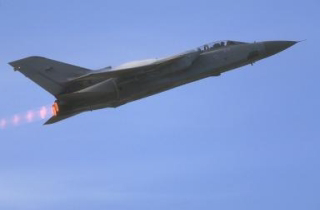

Scaling Image


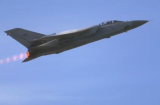

Rotation (45 degree) Image


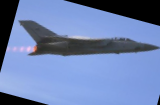

Translation (x, y:+10) Image


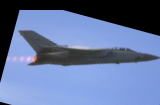

Translation (x:+10, y:+20) Image


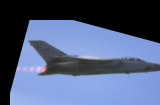

Translation (x:+30, y:+20) Image


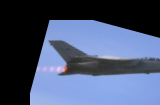

In [72]:
img = cv2.imread('./gdrive/MyDrive/Genia/2310_OpenCV/Image_Processing/airplane.bmp')

resize = cv2.resize(img, None, fx=0.5, fy=0.5, interpolation = cv2.INTER_LINEAR)

width, height = resize.shape[:2]
# 회전점을 영상 모서리 -> 영상 중심으로 변경
M = cv2.getRotationMatrix2D(((width-1)/2.0, (height-1)/2.0), -15, 1)
rotate = cv2.warpAffine(resize, M, (height, width))

M3 = np.float32([[1, 0, 0], [0, 1, +10]])
translate3 = cv2.warpAffine(rotate, M3, (height, width))
M2 = np.float32([[1, 0, 10], [0, 1, +20]])
translate2 = cv2.warpAffine(rotate, M2, (height, width))
M = np.float32([[1, 0, 30], [0, 1, +20]])
translate = cv2.warpAffine(rotate, M, (height, width))

print('Original Image')
cv2_imshow(img)
print('Scaling Image')
cv2_imshow(resize)
print('Rotation (45 degree) Image')
cv2_imshow(rotate)
print('Translation (x, y:+10) Image')
cv2_imshow(translate3)
print('Translation (x:+10, y:+20) Image')
cv2_imshow(translate2)
print('Translation (x:+30, y:+20) Image')
cv2_imshow(translate)